# Package Imports

In [ ]:
import numpy as np
import os, sys
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras
import cv2
import pandas as pd
#from IPython.display import display
#from IPython.display import Image as _Imgdis
from PIL import Image
import math
import csv

from google.colab.patches import cv2_imshow

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Flatten, AvgPool2D, BatchNormalization, Dropout, Activation, MaxPooling2D,Add,Input
from tensorflow.keras.optimizers import Adam,SGD
from tensorflow import keras

from tensorflow.keras.models import  Model
from tensorflow.keras.callbacks import ModelCheckpoint, History
from tensorflow.keras.layers import Activation, Convolution2D, MaxPooling2D, BatchNormalization, Flatten, Dense, Dropout, Conv2D,MaxPool2D, ZeroPadding2D

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
  %cd /content/drive/My Drive

/content/drive/My Drive


# Data Import and Processing

In [ ]:
 with open('Perception-Shared/kpr_transpose.csv', 'r') as file:
    reader = csv.reader(file, delimiter = ',')
    header = next(reader)
    y = []
    for row in reader:
        y.append(row)

In [ ]:
y_dat = pd.DataFrame(y)
y_dat

,0,1,2,3,4,5,6,7,8,9,...,81,82,83,84,85,86,87,88,89,90
0,70,64,87,62,95,63,104,29,24,33,...,34,22,42,36,35,53,40,66,44,81
1,44,78,73,106,99,135,127,12,24,23,...,44,63,55,23,52,46,77,66,103,84
2,ezgif-frame-0142.jpg,ezgif-frame-0142.jpg,ezgif-frame-0142.jpg,ezgif-frame-0142.jpg,ezgif-frame-0142.jpg,ezgif-frame-0142.jpg,ezgif-frame-0142.jpg,ezgif-frame-0143.jpg,ezgif-frame-0143.jpg,ezgif-frame-0143.jpg,...,ezgif-frame-146.jpg,ezgif-frame-146.jpg,ezgif-frame-146.jpg,ezgif-frame-1462.jpg,ezgif-frame-1462.jpg,ezgif-frame-1462.jpg,ezgif-frame-1462.jpg,ezgif-frame-1462.jpg,ezgif-frame-1462.jpg,ezgif-frame-1462.jpg
3,145,145,145,145,145,145,145,57,57,57,...,64,64,64,117,117,117,117,117,117,117
4,211,211,211,211,211,211,211,68,68,68,...,92,92,92,139,139,139,139,139,139,139


In [ ]:
# Label Processing

In [ ]:
y_dat = pd.DataFrame(y_dat.values[:],columns = header )
y_dat

,top_x,mid_L_top_x,mid_R_top_x,mid_L_bot_x,mid_R_bot_x,bot_L_x,bot_R_x,top_x,mid_L_top_x,mid_R_top_x,...,mid_R_bot_x,bot_L_x,bot_R_x,top_x,mid_L_top_x,mid_R_top_x,mid_L_bot_x,mid_R_bot_x,bot_L_x,bot_R_x
0,70,64,87,62,95,63,104,29,24,33,...,34,22,42,36,35,53,40,66,44,81
1,44,78,73,106,99,135,127,12,24,23,...,44,63,55,23,52,46,77,66,103,84
2,ezgif-frame-0142.jpg,ezgif-frame-0142.jpg,ezgif-frame-0142.jpg,ezgif-frame-0142.jpg,ezgif-frame-0142.jpg,ezgif-frame-0142.jpg,ezgif-frame-0142.jpg,ezgif-frame-0143.jpg,ezgif-frame-0143.jpg,ezgif-frame-0143.jpg,...,ezgif-frame-146.jpg,ezgif-frame-146.jpg,ezgif-frame-146.jpg,ezgif-frame-1462.jpg,ezgif-frame-1462.jpg,ezgif-frame-1462.jpg,ezgif-frame-1462.jpg,ezgif-frame-1462.jpg,ezgif-frame-1462.jpg,ezgif-frame-1462.jpg
3,145,145,145,145,145,145,145,57,57,57,...,64,64,64,117,117,117,117,117,117,117
4,211,211,211,211,211,211,211,68,68,68,...,92,92,92,139,139,139,139,139,139,139


In [ ]:
y_dat.iloc[0][0:7]

top_x           70
mid_L_top_x     64
mid_R_top_x     87
mid_L_bot_x     62
mid_R_bot_x     95
bot_L_x         63
bot_R_x        104
Name: 0, dtype: object

In [ ]:
# Create a dataframe for the inputs of x coordinates
x_inputs_columns = ["top_x", "mid_L_top_x", "mid_R_top_x", "mid_L_bot_x", "mid_R_bot_x", "bot_L_x", "bot_R_x"]
x_df = pd.DataFrame(columns=x_inputs_columns)
x_df

,top_x,mid_L_top_x,mid_R_top_x,mid_L_bot_x,mid_R_bot_x,bot_L_x,bot_R_x


In [ ]:
# Processing CSV file for x values
i = 0
while i+7 <= len(y_dat.columns):
  seven_keypoints = y_dat.iloc[0, i:i+7].values
  i = i+7
  x_df.loc[len(x_df)] = seven_keypoints
x_df

,top_x,mid_L_top_x,mid_R_top_x,mid_L_bot_x,mid_R_bot_x,bot_L_x,bot_R_x
0,70,64,87,62,95,63,104
1,29,24,33,22,34,20,38
2,42,35,50,34,54,31,59
3,30,26,34,25,39,23,45
4,23,20,26,19,29,17,32
5,42,39,55,40,65,42,76
6,23,20,26,17,27,16,29
7,33,28,38,26,41,22,45
8,33,29,43,29,51,27,61
9,27,23,32,22,36,21,41


In [ ]:
# Create a dataframe for the inputs of y coordinates
y_inputs_columns = ["top_y", "mid_L_top_y", "mid_R_top_y", "mid_L_bot_y", "mid_R_bot_y", "bot_L_y", "bot_R_y"]
y_df = pd.DataFrame(columns=y_inputs_columns)
y_df

,top_y,mid_L_top_y,mid_R_top_y,mid_L_bot_y,mid_R_bot_y,bot_L_y,bot_R_y


In [ ]:
# Processing CSV file for y values
i = 0
while i+7 <= len(y_dat.columns):
  seven_keypoints = y_dat.iloc[1, i:i+7].values
  i = i+7
  y_df.loc[len(y_df)] = seven_keypoints
y_df

,top_y,mid_L_top_y,mid_R_top_y,mid_L_bot_y,mid_R_bot_y,bot_L_y,bot_R_y
0,44,78,73,106,99,135,127
1,12,24,23,34,34,47,46
2,20,40,39,59,57,78,75
3,16,27,27,41,39,54,54
4,12,22,21,31,31,41,39
5,27,52,48,75,68,98,90
6,13,21,21,30,30,39,39
7,14,30,30,45,44,59,59
8,34,57,53,80,74,105,94
9,16,29,27,43,40,56,52


In [ ]:
y_dat

,top_x,mid_L_top_x,mid_R_top_x,mid_L_bot_x,mid_R_bot_x,bot_L_x,bot_R_x,top_x,mid_L_top_x,mid_R_top_x,...,mid_R_bot_x,bot_L_x,bot_R_x,top_x,mid_L_top_x,mid_R_top_x,mid_L_bot_x,mid_R_bot_x,bot_L_x,bot_R_x
0,70,64,87,62,95,63,104,29,24,33,...,34,22,42,36,35,53,40,66,44,81
1,44,78,73,106,99,135,127,12,24,23,...,44,63,55,23,52,46,77,66,103,84
2,ezgif-frame-0142.jpg,ezgif-frame-0142.jpg,ezgif-frame-0142.jpg,ezgif-frame-0142.jpg,ezgif-frame-0142.jpg,ezgif-frame-0142.jpg,ezgif-frame-0142.jpg,ezgif-frame-0143.jpg,ezgif-frame-0143.jpg,ezgif-frame-0143.jpg,...,ezgif-frame-146.jpg,ezgif-frame-146.jpg,ezgif-frame-146.jpg,ezgif-frame-1462.jpg,ezgif-frame-1462.jpg,ezgif-frame-1462.jpg,ezgif-frame-1462.jpg,ezgif-frame-1462.jpg,ezgif-frame-1462.jpg,ezgif-frame-1462.jpg
3,145,145,145,145,145,145,145,57,57,57,...,64,64,64,117,117,117,117,117,117,117
4,211,211,211,211,211,211,211,68,68,68,...,92,92,92,139,139,139,139,139,139,139


In [ ]:
# Scaling

In [ ]:
targetSize = (80, 80)
inputImages = []
origImagSize = []

#Scaling images
for filename in range(len(y_dat.loc[2].unique())):
  img = cv2.imread('Perception-Shared/annotated_imgs/' + str(filename) + '.jpg')
  #imread as grayscale

  origImagSize.append(img.shape)
  img = cv2.resize(img,targetSize)
  inputImages.append(img)



def get_scale(orig_im_size,targetSize):
  target_h, target_w = targetSize
  h_scale = target_h / orig_im_size[0]
  w_scale = target_w / orig_im_size[1]

  return h_scale, w_scale

In [ ]:
#Scaling keypoints
inpKeypointsX_arr = np.array(x_df,dtype= 'float32')
inpKeypointsY_arr = np.array(y_df,dtype= 'float32')

KeyptsXscaled = pd.DataFrame()  
KeyptsYscaled = pd.DataFrame() 

for i in range(len(inputImages)):
  h_scale_i,w_scale_i = get_scale(origImagSize[i],targetSize) 
  KeyptsXscaled[i] = inpKeypointsX_arr[i]*w_scale_i
  KeyptsYscaled[i] = inpKeypointsY_arr[i]*h_scale_i

KeyptsXscaled = KeyptsXscaled.T
KeyptsYscaled = KeyptsYscaled.T

KeyptsX = pd.DataFrame(data=KeyptsXscaled.values, columns=x_df.columns)
KeyptsY = pd.DataFrame(data=KeyptsYscaled.values, columns=y_df.columns)

keypt= pd.DataFrame() 

for column in range(len(KeyptsY.columns)):
  keypt[KeyptsX.columns[column]]=KeyptsX.iloc[:,column]
  keypt[KeyptsY.columns[column]]=KeyptsY.iloc[:,column]

keypt = np.ceil(keypt)
keypt

,top_x,top_y,mid_L_top_x,mid_L_top_y,mid_R_top_x,mid_R_top_y,mid_L_bot_x,mid_L_bot_y,mid_R_bot_x,mid_R_bot_y,bot_L_x,bot_L_y,bot_R_x,bot_R_y
0,39.0,17.0,36.0,30.0,48.0,28.0,35.0,41.0,53.0,38.0,35.0,52.0,58.0,49.0
1,41.0,15.0,34.0,29.0,47.0,28.0,31.0,40.0,48.0,40.0,29.0,56.0,54.0,55.0
2,40.0,13.0,33.0,26.0,48.0,25.0,32.0,38.0,51.0,37.0,30.0,50.0,56.0,48.0
3,39.0,17.0,34.0,28.0,44.0,28.0,33.0,42.0,51.0,40.0,30.0,55.0,59.0,55.0
4,40.0,17.0,35.0,31.0,45.0,30.0,33.0,44.0,50.0,44.0,29.0,58.0,55.0,55.0
5,32.0,16.0,30.0,31.0,42.0,28.0,31.0,44.0,50.0,40.0,32.0,57.0,58.0,53.0
6,44.0,20.0,39.0,32.0,50.0,32.0,33.0,45.0,52.0,45.0,31.0,58.0,56.0,58.0
7,41.0,13.0,35.0,27.0,47.0,27.0,32.0,40.0,51.0,39.0,28.0,52.0,56.0,52.0
8,29.0,21.0,25.0,35.0,37.0,32.0,25.0,48.0,44.0,45.0,24.0,63.0,53.0,57.0
9,36.0,16.0,31.0,29.0,43.0,27.0,30.0,43.0,48.0,40.0,28.0,56.0,55.0,52.0


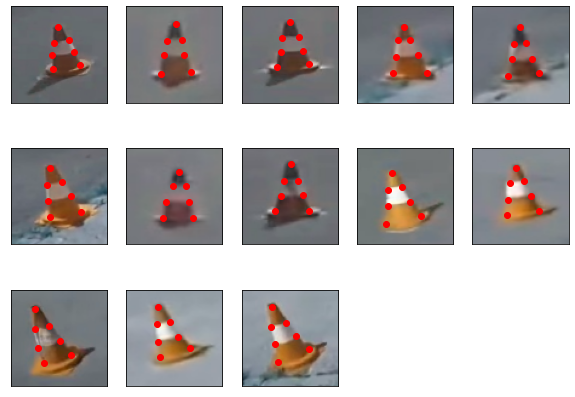

In [ ]:
fig = plt.figure(figsize=(10, 10))

for i in range(len(inputImages)):
    fig.add_subplot(4, 5, i + 1, xticks=[], yticks=[])

    new_img = inputImages[i]

    plt.imshow(new_img)
    plt.scatter(KeyptsX.loc[i], KeyptsY.loc[i], color='red')

plt.show()

In [ ]:
# Augmentation by Flipping
flipped_imgs = [np.fliplr(np.copy(img)) for img in inputImages]

KeyptsXFlipped = -KeyptsX + targetSize[1]
KeyptsYFlipped = KeyptsY.copy()

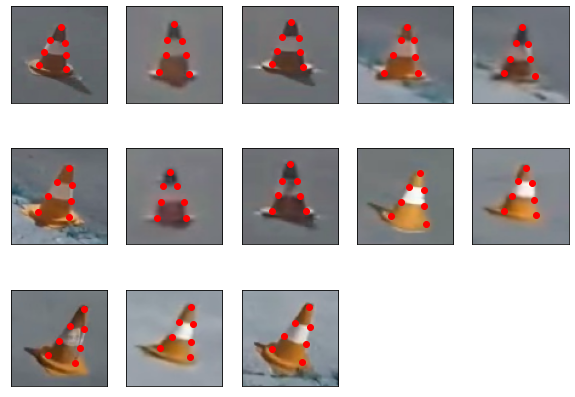

In [ ]:
fig = plt.figure(figsize=(10, 10))

for i in range(len(flipped_imgs)):
    fig.add_subplot(4, 5, i + 1, xticks=[], yticks=[])

    new_img = flipped_imgs[i]

    plt.imshow(new_img)
    plt.scatter(KeyptsXFlipped.loc[i], KeyptsYFlipped.loc[i], color='red')

plt.show()

In [ ]:
# Adjust image intensity according to scale

def adj_intensity(img, scale_up, scale_down):

  new_img = np.copy(img)
  inc_brightness_images = np.clip(np.trunc(new_img*scale_up), 0, 255).astype(int)
  dec_brightness_images = np.clip(np.trunc(new_img*scale_down), 0, 255).astype(int)

  return inc_brightness_images, dec_brightness_images

In [ ]:
# Deterministic intensity changes

intensity_dec = []
intensity_inc = []

KeyptsXIntensityDec = KeyptsX.copy()
KeyptsYIntensityDec = KeyptsY.copy()
KeyptsXIntensityInc = KeyptsX.copy()
KeyptsYIntensityInc = KeyptsY.copy()

for i in range(len(inputImages)):
    img = np.copy(inputImages[i])
    
    inc, dec = adj_intensity(img, 1.3, 0.9)
    intensity_dec.append(dec)
    intensity_inc.append(inc)

In [ ]:
# Random intensity changes

rand_intensity_dec = []
rand_intensity_inc = []

KeyptsXIntensityDecRand = KeyptsX.copy()
KeyptsYIntensityDecRand = KeyptsY.copy()
KeyptsXIntensityIncRand = KeyptsX.copy()
KeyptsYIntensityIncRand = KeyptsY.copy()

for i in range(len(inputImages)):
    img = np.copy(inputImages[i])
    inc, dec = adj_intensity(img, np.random.uniform(1, 1.7), np.random.uniform(0.4, 1))
    rand_intensity_dec.append(dec)
    rand_intensity_inc.append(inc)

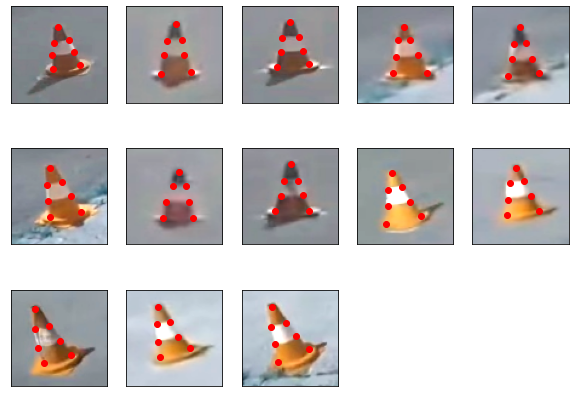

In [ ]:
# Determ intensity increase plots

fig = plt.figure(figsize=(10, 10))

for i in range(len(intensity_inc)):
    fig.add_subplot(4, 5, i + 1, xticks=[], yticks=[])

    new_img = intensity_inc[i]

    plt.imshow(new_img);
    plt.scatter(KeyptsXIntensityInc.loc[i], KeyptsYIntensityInc.loc[i], color='red');

plt.show();

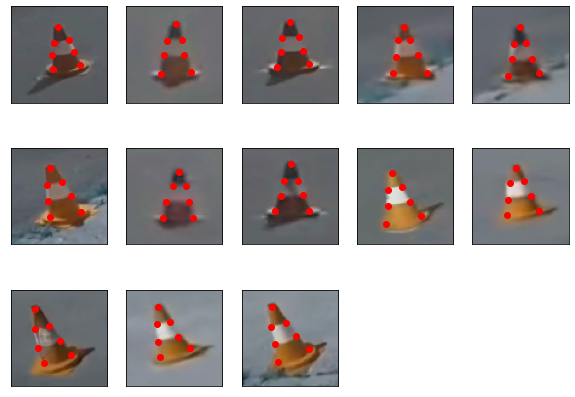

In [ ]:
# Determ intensity decrease plots

fig = plt.figure(figsize=(10, 10))

for i in range(len(intensity_dec)):
    fig.add_subplot(4, 5, i + 1, xticks=[], yticks=[])

    new_img = intensity_dec[i]

    plt.imshow(new_img);
    plt.scatter(KeyptsXIntensityDec.loc[i], KeyptsYIntensityDec.loc[i], color='red');

plt.show();

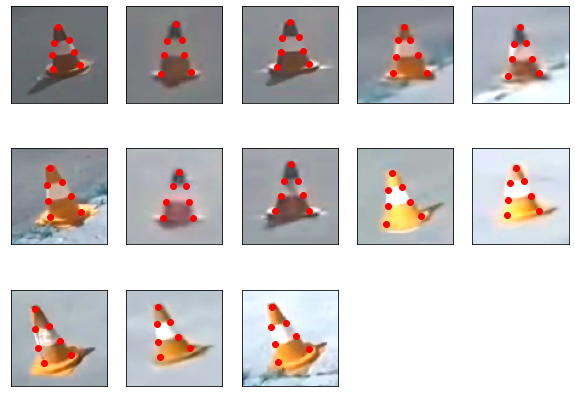

In [ ]:
# Random intensity increase plots

fig = plt.figure(figsize=(10, 10))

for i in range(len(rand_intensity_inc)):
    fig.add_subplot(4, 5, i + 1, xticks=[], yticks=[])

    new_img = rand_intensity_inc[i]

    plt.imshow(new_img);
    plt.scatter(KeyptsXIntensityIncRand.loc[i], KeyptsYIntensityIncRand.loc[i], color='red');

plt.show();

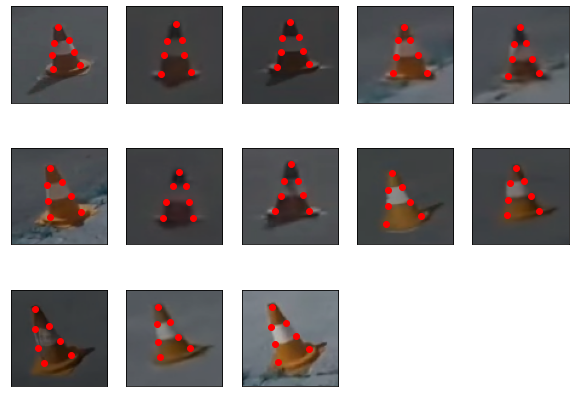

In [ ]:
# Random intensity decrease plots

fig = plt.figure(figsize=(10, 10))

for i in range(len(rand_intensity_dec)):
    fig.add_subplot(4, 5, i + 1, xticks=[], yticks=[])

    new_img = rand_intensity_dec[i]

    plt.imshow(new_img);
    plt.scatter(KeyptsXIntensityDecRand.loc[i], KeyptsYIntensityDecRand.loc[i], color='red');

plt.show();

In [ ]:
# Data set of images

images_final = np.concatenate((inputImages, flipped_imgs, intensity_inc, intensity_dec, rand_intensity_inc, rand_intensity_dec))

In [ ]:
# keypoint array helper combiner

def key_pts_combine(X, Y):
    Combined = X.copy()
    Combined[Y.columns] = Y.copy()
    cols = Combined.columns.to_list()
    columns_new = sum([[cols[i], cols[i + 7]] for i in range(7)], [])

    Combined = Combined.reindex(columns = columns_new)

    return Combined.to_numpy()

In [ ]:
keypts_intermediate = [(KeyptsX, KeyptsY), (KeyptsXFlipped, KeyptsYFlipped), (KeyptsXIntensityInc, KeyptsYIntensityInc)]
keypts_intermediate = keypts_intermediate + [(KeyptsXIntensityDec, KeyptsYIntensityDec), (KeyptsXIntensityIncRand, KeyptsYIntensityIncRand)]
keypts_intermediate = keypts_intermediate + [(KeyptsXIntensityDecRand, KeyptsYIntensityDecRand)]

keypts_final = np.concatenate([key_pts_combine(X, Y) for (X, Y) in keypts_intermediate])

In [ ]:
#keypts_final is your keypoints, by image, 14 points per image, ordered (x,y) for every 2 elements
#final_images is your images, 80x80x3 per image

print(keypts_final.shape)
print(images_final.shape)

(78, 14)
(78, 80, 80, 3)


In [ ]:
def showImageRange(i, j):
    assert j - i <= 20, 'max 20 imgs'
    fig = plt.figure(figsize=(10, 10))

    for k in range(j - i):  
        fig.add_subplot(4, 5, k + 1, xticks = [], yticks = [])

        new_img = images_final[k + i]
        plt.imshow(new_img)
        plt.scatter(keypts_final[k + i][::2], keypts_final[k + i][1::2], color='red')

    plt.show();

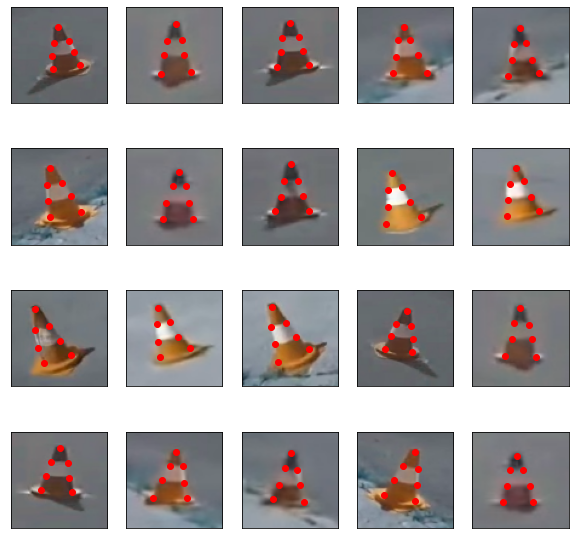

In [ ]:
showImageRange(0, 20)

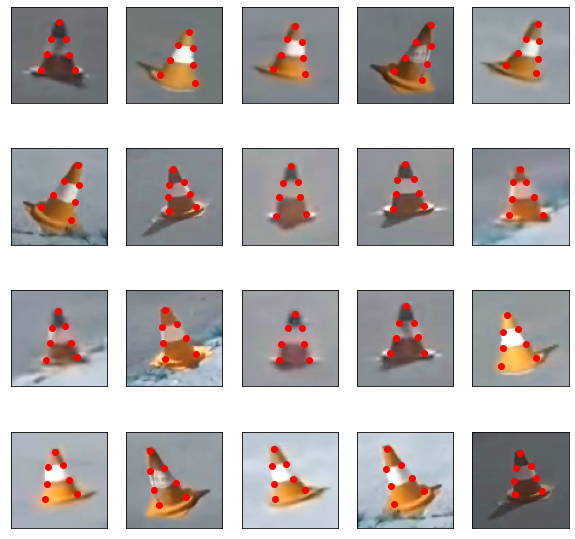

In [ ]:
showImageRange(20, 40)

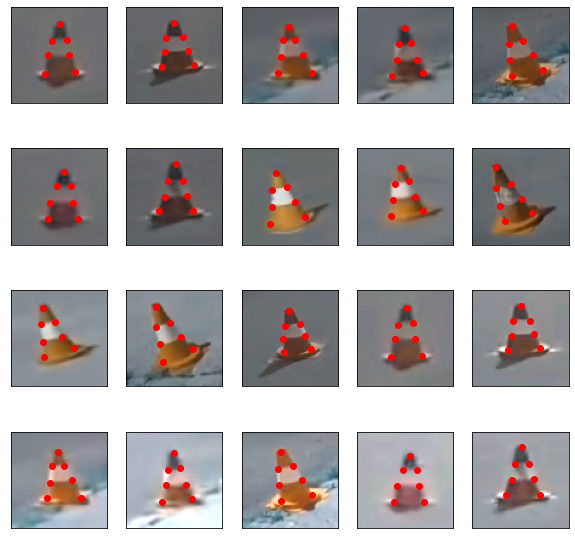

In [ ]:
showImageRange(40, 60)

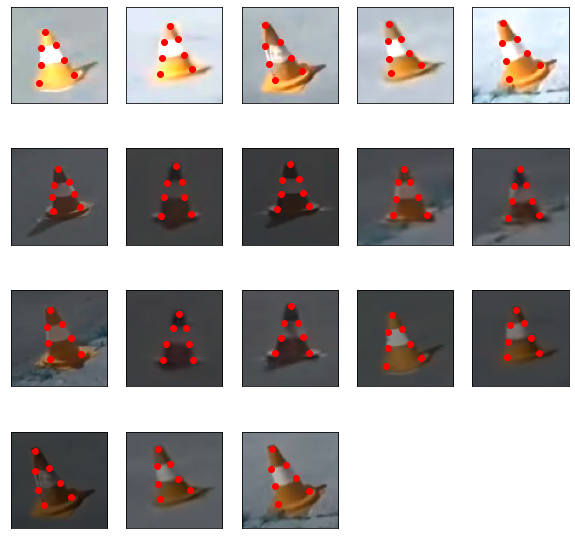

In [ ]:
showImageRange(60, len(images_final))

In [ ]:
# Split model into training and test data

In [ ]:
from sklearn.model_selection import train_test_split 

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(images_final, keypts_final, test_size=0.2, random_state=42)

In [ ]:
X_train.shape

(62, 80, 80, 3)

In [ ]:
y_train.shape

(62, 14)

# Cross Ratio Model Testing - From Previous Notebook

In [ ]:
from sklearn.model_selection import train_test_split 
from tensorflow.keras import backend as k

In [ ]:
checkpoint = ModelCheckpoint('best_thus_far_cr', verbose=1, monitor='val_loss',save_best_only=True, mode='auto')

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(images_final, keypts_final, test_size=0.2, random_state=42)


In [ ]:
X_train.shape


(62, 80, 80, 3)

In [ ]:
y_train.shape

(62, 14)

In [ ]:
# Neural Network

In [ ]:
# ResNet Layer taken from MIT

# Info: ResNet Block is essentially a group of convolutions, batch normalization,
# and activation functions in chain. This adds density to the model in order to make
# more accurate predictions and fit the training data better. A good analogy to math 
# would be similar to using a higher dimensional model to fit a dataset but this is not
# an exact comparison.

def ResNetBlock(input_data,C):

  x = Conv2D(filters=C,kernel_size=(3,3),padding='same',dilation_rate=(2,2))(input_data)
  x = BatchNormalization()(x)
  x = Activation('relu')(x)
  #LeakyReLU(alpha = 0.1)

  x = Conv2D(filters= C,kernel_size=(3,3),padding='same')(x)
  x = BatchNormalization()(x)
  #x = Activation('relu')(x)
  #x = Dropout(0.2)(x)

  x_shortcut = Conv2D(filters=C,kernel_size=(1,1),padding='same')(input_data)
  x_shortcut = BatchNormalization()(x_shortcut)

  x = Add()([x,x_shortcut])
#x = Dropout(0.3)(x)
  x = Activation('relu')(x)

  #LeakyReLU(alpha = 0.1)
  #Dropout()?

  return x

In [ ]:
input = tf.keras.Input((80, 80, 3))

In [ ]:
num_filters = 64
num_classes = 14

In [ ]:
# Input layer to first CNN layer

nn = tf.keras.layers.Conv2D(filters=num_filters, kernel_size=7,strides=(1,1),padding='same',kernel_initializer='he_normal')(input)

In [ ]:
# Batch normalization

nn = tf.keras.layers.BatchNormalization()(nn)

#Activation function : ReLU (Rectified Linear Unit)

nn = tf.keras.layers.Activation('relu')(nn)


In [ ]:
# Adding ResNet layers
nn = ResNetBlock(nn, 16)
nn = ResNetBlock(nn, 32)
nn = ResNetBlock(nn, 64)

In [ ]:
# Flatten the final activation layer and create output layer

In [ ]:
nn = Flatten()(nn)
output = Dense(14)(nn)

In [ ]:
# Defining the model

In [ ]:
model = Model(input, output)

In [ ]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 80, 80, 3)]  0           []                               
                                                                                                  
 conv2d (Conv2D)                (None, 80, 80, 64)   9472        ['input_1[0][0]']                
                                                                                                  
 batch_normalization (BatchNorm  (None, 80, 80, 64)  256         ['conv2d[0][0]']                 
 alization)                                                                                       
                                                                                                  
 activation (Activation)        (None, 80, 80, 64)   0           ['batch_normalization[0][0]']

In [ ]:
# Model plot

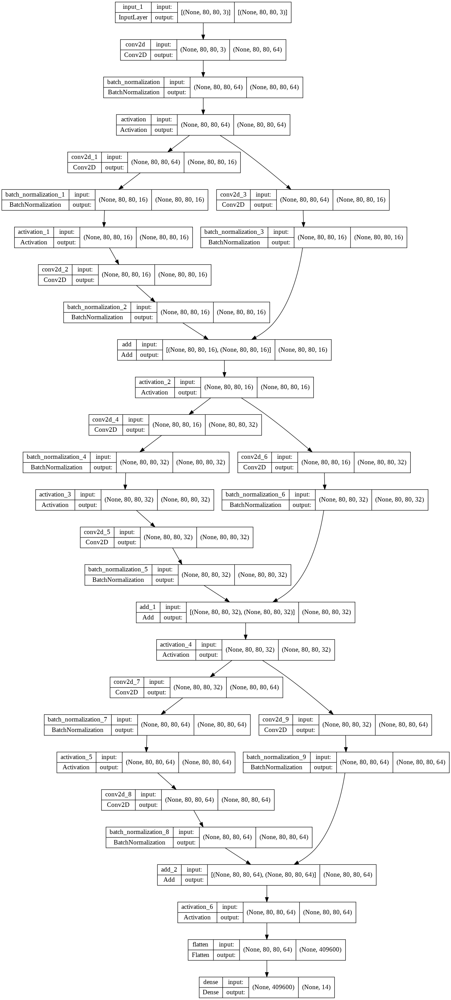

In [ ]:
tf.keras.utils.plot_model(model,show_shapes=True)

In [ ]:
# Compile model with Cr loss
cr3D = 1.39408 # fixed cross ratio for a cone
gamma = 0.005 # 0.005

pts_1 = [0, 1, 2, 3]
pts_2 = [0, 4, 5, 6]

def delta_ij(y, i, j):
    return k.sqrt(k.sum(k.square(y[2*i:2*i+2,] - y[2*j:2*j+2,])))

def cross_ratio(y, pts):
    assert len(pts) == 4, 'must be 4 collinear points'
    return (delta_ij(y, pts[0], pts[2]) / delta_ij(y, pts[0], pts[3])) / (delta_ij(y, pts[1], pts[2]) / delta_ij(y, pts[1], pts[3]))

def cr_loss(y_true, y_pred):
    cr_1_fn = lambda y : cross_ratio(y, pts_1) - cr3D
    cr_2_fn = lambda y: cross_ratio(y, pts_2) - cr3D

    cr_1 = tf.map_fn(cr_1_fn, y_pred)
    cr_2 = tf.map_fn(cr_2_fn, y_pred)

    return tf.reduce_mean(tf.math.square(y_true - y_pred), axis=-1) + gamma * tf.reduce_mean(tf.math.square(cr_1)) 
    + gamma * tf.reduce_mean(tf.math.square(cr_2))

In [ ]:
metrics = tf.keras.metrics.MeanSquaredError()

In [ ]:
%load_ext tensorboard
import datetime

In [ ]:
logdir = os.path.join("logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
tensorboard_callback = tf.keras.callbacks.TensorBoard(logdir, histogram_freq=1)
model.compile(loss=cr_loss, optimizer=Adam(0.001), metrics = [metrics])

In [ ]:
weights_train = model.fit(X_train, y_train, validation_split=0.2, batch_size = 4, shuffle=True, epochs=100, verbose=1, callbacks = [tensorboard_callback, checkpoint])

Epoch 1/100
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: Inconsistent ASTs detected. This is a bug. Cause: 
inconsistent nodes: <gast.gast.Tuple object at 0x7f657fa15590> (Tuple) and <gast.gast.Slice object at 0x7f65819242d0> (Slice)Diff:
*** Original nodes

--- Reparsed nodes

***************

*** 254,322 ****

  | | | | | | | | | | | | | | | | | | | | | | | | | | | Name:
  | | | | | | | | | | | | | | | | | | | | | | | | | | | | id=u"y"
  | | | | | | | | | | | | | | | | | | | | | | | | | | | | ctx=Load()
  | | | | | | | | | | | | | | | | | | | | | | | | | | | | annotation=None
  | | | | | | | | | | | | | | | | | | | | | | | | | | | | type_comment=None
  | | | | | | | | | | | | | | | | | | | | | | | | | | ]
  | | | | | | | | | | | | | | | | | | | | | | | | | | keywords=[]
! | | | | | | | | | | | | | | | | | | | | | | | | | slice=Tuple:
! | | | | | | | | | | | | | | 

In [ ]:
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

In [ ]:
# Test predictions model accuracy

In [ ]:
keypt_predictions = model.predict(X_test)

In [ ]:
keypt_predictions[0]

array([38.195324 , 10.8593445, 32.20675  , 24.617882 , 45.07709  ,
       24.668331 , 29.727205 , 37.79934  , 49.296463 , 36.892117 ,
       25.150621 , 50.03809  , 54.892265 , 49.60597  ], dtype=float32)

In [ ]:
# Display the results

In [ ]:
def plot_keypoints(img,points):
  img = img#.reshape(targetSize[0],targetSize[1])
  plt.imshow(img,cmap='gray')
  for i in range(0,14,2):
    plt.scatter((points[i] + 0.5)*targetSize[0], (points[i+1]+0.5)*targetSize[0], color='red')

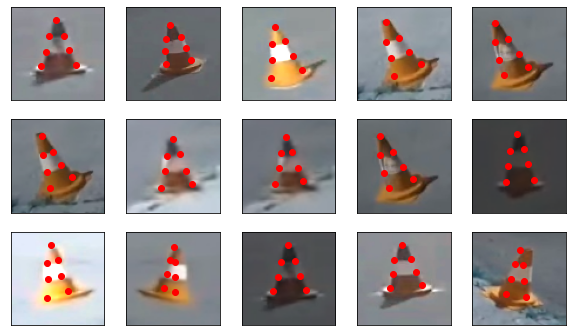

In [ ]:
fig = plt.figure(figsize=(10, 10))


for id in range(15):
    ax = fig.add_subplot(5, 5, id + 1, xticks=[], yticks=[])
    x_values = keypt_predictions[id][::2]
    y_values = keypt_predictions[id][1::2]
    plt.imshow(X_test[id])
    plt.scatter(x_values, y_values, color='red');

plt.show()

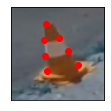

In [ ]:
fig = plt.figure(figsize=(10, 10))


for id in range(15, X_test.shape[0]):
    ax = fig.add_subplot(5, 5, id - 14, xticks=[], yticks=[])
    x_values = keypt_predictions[id][::2]
    y_values = keypt_predictions[id][1::2]
    plt.imshow(X_test[id])
    plt.scatter(x_values, y_values, color='red');

plt.show()

# Adaloss Model With 7 Layers

## Loss function, data preprocessing

In [ ]:
def gaussian(xL, yL, sigma = 5.0):
    # convolve about a gaussian kernel about the keypoint

    H = W = 80

    channel = [np.exp(-((c - xL) ** 2 + (r - yL) ** 2) / (2.0 * sigma * sigma)) for r in range(H) for c in range(W)]
    channel = np.array(channel, dtype=np.float32)
    channel = np.reshape(channel, newshape=(H, W))

    return channel

In [ ]:
## Make training outputs into heatmaps
y_heatmaps_train = np.array([[gaussian(y_train[j][2*i], y_train[j][2*i + 1]) for i in range(7)] for j in range(len(y_train))])
y_heatmaps_train_T = np.swapaxes(y_heatmaps_train,1,3)
y_heatmaps_train_T = np.swapaxes(y_heatmaps_train_T,1,2)

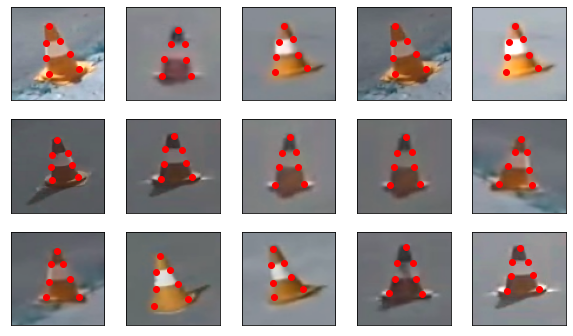

In [ ]:
pred_keypts = []

for img in y_heatmaps_train:
  keypts_img = []  
  for heatmap in img:
    pred_xy = np.argmax(heatmap)
    x = pred_xy % 80
    y = pred_xy / 80
    keypts_img.append(x)
    keypts_img.append(y)
  pred_keypts.append(keypts_img)

keypt_predictions = np.array(pred_keypts)

fig = plt.figure(figsize=(10, 10))


for id in range(15):
    ax = fig.add_subplot(5, 5, id + 1, xticks=[], yticks=[])
    x_values = keypt_predictions[id][::2]
    y_values = keypt_predictions[id][1::2]
    plt.imshow(X_train[id])
    plt.scatter(x_values, y_values, color='red');

plt.show()


## Model architecture

In [ ]:
from sklearn.model_selection import train_test_split 
from tensorflow.keras import backend as k

In [ ]:
w = 3
rho = 0.9
sigmas = 20 * np.ones(7)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(images_final, keypts_final, test_size=0.2, random_state=42)

In [ ]:
X_train.shape


(62, 80, 80, 3)

In [ ]:
y_train.shape

(62, 14)

In [ ]:
# Neural Network

In [ ]:
# ResNet Layer taken from MIT

# Info: ResNet Block is essentially a group of convolutions, batch normalization,
# and activation functions in chain. This adds density to the model in order to make
# more accurate predictions and fit the training data better. A good analogy to math 
# would be similar to using a higher dimensional model to fit a dataset but this is not
# an exact comparison.

def ResNetBlock(input_data,C):

  x = Conv2D(filters=C,kernel_size=(3,3),padding='same',dilation_rate=(2,2))(input_data)
  x = BatchNormalization()(x)
  x = Activation('relu')(x)
  #LeakyReLU(alpha = 0.1)

  x = Conv2D(filters= C,kernel_size=(3,3),padding='same')(x)
  x = BatchNormalization()(x)
  #x = Activation('relu')(x)
  #x = Dropout(0.2)(x)

  x_shortcut = Conv2D(filters=C,kernel_size=(1,1),padding='same')(input_data)
  x_shortcut = BatchNormalization()(x_shortcut)

  x = Add()([x,x_shortcut])
#x = Dropout(0.3)(x)
  x = Activation('relu')(x)

  #LeakyReLU(alpha = 0.1)
  #Dropout()?

  return x

In [ ]:
input = tf.keras.Input((80, 80, 3))

In [ ]:
num_filters = 64
num_classes = 14

In [ ]:
# Input layer to first CNN layer

nn = tf.keras.layers.Conv2D(filters=num_filters, kernel_size=7,strides=(1,1),padding='same',kernel_initializer='he_normal')(input)

In [ ]:
# Batch normalization

nn = tf.keras.layers.BatchNormalization()(nn)

#Activation function : ReLU (Rectified Linear Unit)

nn = tf.keras.layers.Activation('relu')(nn)


In [ ]:
# Adding ResNet layers
nn = ResNetBlock(nn, 16)
nn = ResNetBlock(nn, 32)
nn = ResNetBlock(nn, 64)
nn = ResNetBlock(nn, 32)
nn = ResNetBlock(nn, 16)

In [ ]:
# Flatten the final activation layer and create output layer

In [ ]:
#ADDING output resnet layer
output = ResNetBlock(nn, 7)

In [ ]:
# Defining the model

In [ ]:
model = Model(input, output)

In [ ]:
model.summary()

Model: "model_5"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_6 (InputLayer)           [(None, 80, 80, 3)]  0           []                               
                                                                                                  
 conv2d_86 (Conv2D)             (None, 80, 80, 64)   9472        ['input_6[0][0]']                
                                                                                                  
 batch_normalization_86 (BatchN  (None, 80, 80, 64)  256         ['conv2d_86[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 activation_59 (Activation)     (None, 80, 80, 64)   0           ['batch_normalization_86[0]

In [ ]:
# Model plot

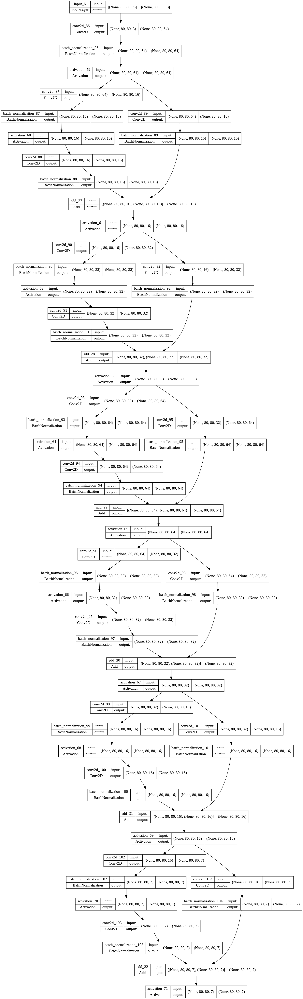

In [ ]:
tf.keras.utils.plot_model(model,show_shapes=True)

## Training

In [ ]:
metrics = tf.keras.metrics.MeanSquaredError()
#checkpoint = ModelCheckpoint('best_thus_far_heatmap', verbose=1, monitor='val_loss',save_best_only=True, mode='auto')
history = History()

In [ ]:
%load_ext tensorboard
import datetime

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [ ]:
logdir = os.path.join("logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
tensorboard_callback = tf.keras.callbacks.TensorBoard(logdir, histogram_freq=1)
model.compile(loss=tf.keras.losses.MeanSquaredError(), optimizer=Adam(0.001), metrics = [metrics])
history = History()

In [ ]:
w = 15
var_prev = None
var_curr = None
rho_2 = 0.05
sigma = 5

weights_train = model.fit(X_train, y_heatmaps_train_T, validation_split=0.2, batch_size = 4, shuffle=True, epochs=w, verbose=1, callbacks = [tensorboard_callback, history])
model.save('adaloss/thus_far.h5')

Epoch 1/15
13/13 [==============================] - 17s 1s/step - loss: 0.3687 - mean_squared_error: 0.3687 - val_loss: 7.9395 - val_mean_squared_error: 7.9395
Epoch 2/15
13/13 [==============================] - 14s 1s/step - loss: 0.0471 - mean_squared_error: 0.0471 - val_loss: 3.1846 - val_mean_squared_error: 3.1846
Epoch 3/15
13/13 [==============================] - 14s 1s/step - loss: 0.0224 - mean_squared_error: 0.0224 - val_loss: 1.3429 - val_mean_squared_error: 1.3429
Epoch 4/15
13/13 [==============================] - 14s 1s/step - loss: 0.0160 - mean_squared_error: 0.0160 - val_loss: 0.2979 - val_mean_squared_error: 0.2979
Epoch 5/15
13/13 [==============================] - 14s 1s/step - loss: 0.0137 - mean_squared_error: 0.0137 - val_loss: 0.0902 - val_mean_squared_error: 0.0902
Epoch 6/15
13/13 [==============================] - 14s 1s/step - loss: 0.0127 - mean_squared_error: 0.0127 - val_loss: 0.0416 - val_mean_squared_error: 0.0416
Epoch 7/15
13/13 [======================

In [ ]:
for i in range(1, 124):

  # set sigma
  var_curr = float(np.var(np.array(history.history['val_loss'])))


  if var_prev is not None:
    ## Make training outputs into heatmaps
    sigma = sigma + rho_2*(1 - var_prev / var_curr)

    print("Iteration: " + str(i) + "/123")

    y_heatmaps_train = np.array([[gaussian(y_train[j][2*i], y_train[j][2*i + 1], sigma) for i in range(7)] for j in range(len(y_train))])
    y_heatmaps_train_T = np.swapaxes(y_heatmaps_train,1,3)
    y_heatmaps_train_T = np.swapaxes(y_heatmaps_train_T,1,2)
      
  var_prev = var_curr



  # set new window history and continue training
  history.history['val_loss'].pop(0)
  model = tf.keras.models.load_model('adaloss/thus_far.h5')
  weights_train = model.fit(X_train, y_heatmaps_train_T, validation_split=0.2, batch_size = 4, shuffle=True, epochs=1, verbose=1, callbacks = [tensorboard_callback, history])
  model.save('adaloss/thus_far.h5')

13/13 [==============================] - 16s 1s/step - loss: 0.0098 - mean_squared_error: 0.0098 - val_loss: 0.0116 - val_mean_squared_error: 0.0116
Iteration: 2/123
13/13 [==============================] - 16s 1s/step - loss: 0.0088 - mean_squared_error: 0.0088 - val_loss: 0.0106 - val_mean_squared_error: 0.0106
Iteration: 3/123
13/13 [==============================] - 16s 1s/step - loss: 0.0078 - mean_squared_error: 0.0078 - val_loss: 0.0095 - val_mean_squared_error: 0.0095
Iteration: 4/123
13/13 [==============================] - 16s 1s/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0067 - val_mean_squared_error: 0.0067
Iteration: 5/123
13/13 [==============================] - 17s 1s/step - loss: 0.0036 - mean_squared_error: 0.0036 - val_loss: 0.0054 - val_mean_squared_error: 0.0054
Iteration: 6/123
13/13 [==============================] - 16s 1s/step - loss: 0.0030 - mean_squared_error: 0.0030 - val_loss: 0.0044 - val_mean_squared_error: 0.0044
Iteration: 7/123
13/1

In [ ]:
 model = tf.keras.models.load_model('adaloss/thus_far.h5')

In [ ]:

%tensorboard --logdir logs

<IPython.core.display.Javascript object>

##Keypoint Predictions

In [ ]:
# Test predictions model accuracy

def predict(X, ground_truths):
  heatmap_predictions = model.predict(X)
  heatmap_predictions = np.swapaxes(heatmap_predictions,1,2)
  heatmap_predictions = np.swapaxes(heatmap_predictions,1,3)

  pred_keypts = []

  for img in heatmap_predictions:
    keypts_img = []  
    for heatmap in img:
      pred_xy = np.argmax(heatmap)
      x = pred_xy % 80
      y = pred_xy // 80
      keypts_img.append(x)
      keypts_img.append(y)
    pred_keypts.append(keypts_img)

  keypt_predictions = np.array(pred_keypts)
  
  ct = 0

  while ct < len(X):
    fig = plt.figure(figsize=(5, 5))

    # predicted
    ax = fig.add_subplot(1, 2, 1, xticks=[], yticks=[])
    x_values = keypt_predictions[ct][::2]
    y_values = keypt_predictions[ct][1::2]
    plt.imshow(X[ct])
    plt.scatter(x_values, y_values, color='red');


    #actual
    ax = fig.add_subplot(1, 2, 2, xticks=[], yticks=[])
    x_values = ground_truths[ct][::2]
    y_values = ground_truths[ct][1::2]
    plt.imshow(X[ct])
    plt.scatter(x_values, y_values, color='red');
    ct += 1


    plt.show();


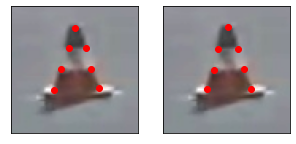

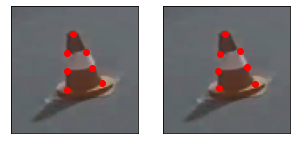

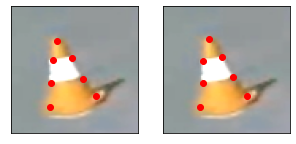

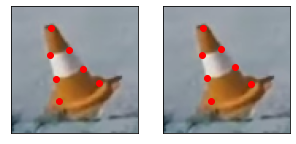

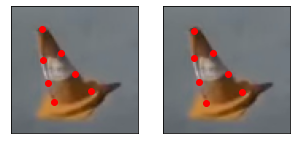

...

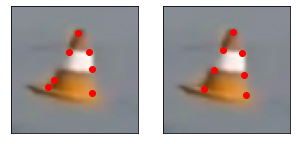

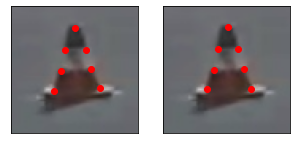

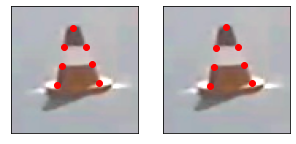

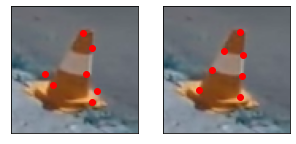

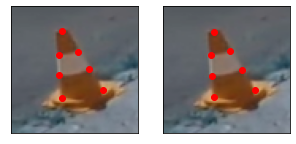

In [ ]:
predict(X_test, y_test)

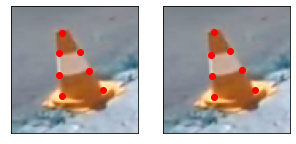

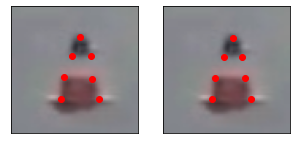

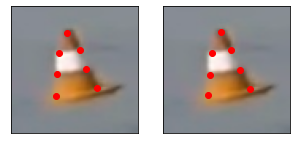

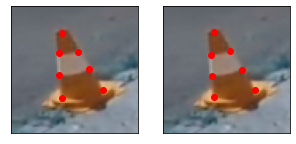

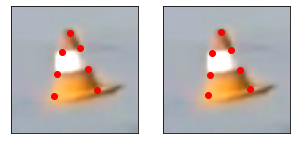

...

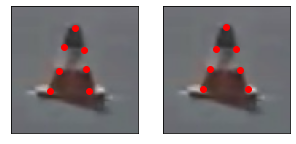

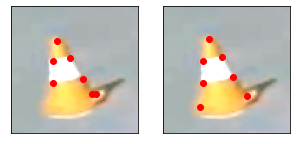

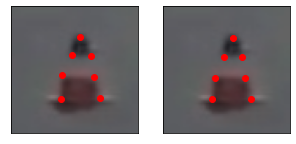

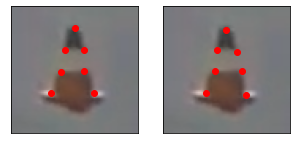

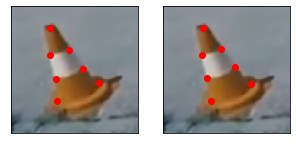

In [ ]:
predict(X_train, y_train)

## Time Test

In [ ]:
import time

delta_avg = 0

for i in range(1, 101):
  start = time.perf_counter()
  heatmap_predictions = model.predict(X_test)
  stop = time.perf_counter()
  delta_avg = (delta_avg * (i - 1) + (stop-start)) / i

print(delta_avg / len(X_test))

0.05793312818187474


# Heatmap Model With 7 Layers

## Model architecture

In [ ]:
from sklearn.model_selection import train_test_split 
from tensorflow.keras import backend as k

In [ ]:
w = 3
rho = 0.9
sigmas = 20 * np.ones(7)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(images_final, keypts_final, test_size=0.2, random_state=42)

In [ ]:
X_train.shape


(62, 80, 80, 3)

In [ ]:
y_train.shape

(62, 14)

In [ ]:
# Neural Network

In [ ]:
# ResNet Layer taken from MIT

# Info: ResNet Block is essentially a group of convolutions, batch normalization,
# and activation functions in chain. This adds density to the model in order to make
# more accurate predictions and fit the training data better. A good analogy to math 
# would be similar to using a higher dimensional model to fit a dataset but this is not
# an exact comparison.

def ResNetBlock(input_data,C):

  x = Conv2D(filters=C,kernel_size=(3,3),padding='same',dilation_rate=(2,2))(input_data)
  x = BatchNormalization()(x)
  x = Activation('relu')(x)
  #LeakyReLU(alpha = 0.1)

  x = Conv2D(filters= C,kernel_size=(3,3),padding='same')(x)
  x = BatchNormalization()(x)
  #x = Activation('relu')(x)
  #x = Dropout(0.2)(x)

  x_shortcut = Conv2D(filters=C,kernel_size=(1,1),padding='same')(input_data)
  x_shortcut = BatchNormalization()(x_shortcut)

  x = Add()([x,x_shortcut])
#x = Dropout(0.3)(x)
  x = Activation('relu')(x)

  #LeakyReLU(alpha = 0.1)
  #Dropout()?

  return x

In [ ]:
input = tf.keras.Input((80, 80, 3))

In [ ]:
num_filters = 64
num_classes = 14

In [ ]:
# Input layer to first CNN layer

nn = tf.keras.layers.Conv2D(filters=num_filters, kernel_size=7,strides=(1,1),padding='same',kernel_initializer='he_normal')(input)

In [ ]:
# Batch normalization

nn = tf.keras.layers.BatchNormalization()(nn)

#Activation function : ReLU (Rectified Linear Unit)

nn = tf.keras.layers.Activation('relu')(nn)


In [ ]:
# Adding ResNet layers
nn = ResNetBlock(nn, 16)
nn = ResNetBlock(nn, 32)
nn = ResNetBlock(nn, 64)
nn = ResNetBlock(nn, 32)
nn = ResNetBlock(nn, 16)

In [ ]:
# Flatten the final activation layer and create output layer

In [ ]:
#ADDING output resnet layer
output = ResNetBlock(nn, 7)

In [ ]:
# Defining the model

In [ ]:
model = Model(input, output)

In [ ]:
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 80, 80, 3)]  0           []                               
                                                                                                  
 conv2d_10 (Conv2D)             (None, 80, 80, 64)   9472        ['input_2[0][0]']                
                                                                                                  
 batch_normalization_10 (BatchN  (None, 80, 80, 64)  256         ['conv2d_10[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 activation_7 (Activation)      (None, 80, 80, 64)   0           ['batch_normalization_10[0]

In [ ]:
# Model plot

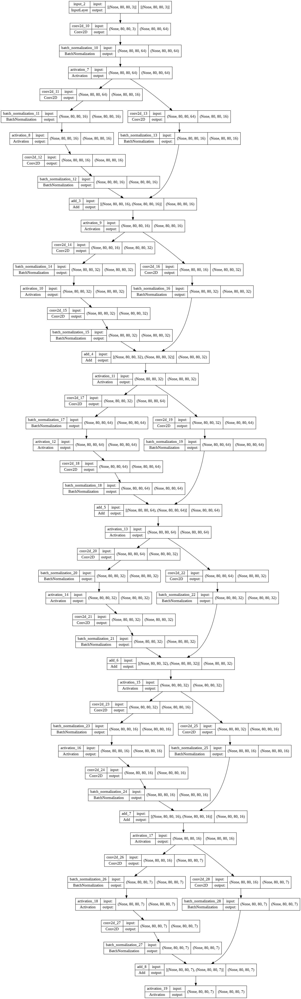

In [ ]:
tf.keras.utils.plot_model(model,show_shapes=True)

## Loss function, data preprocessing

In [ ]:
def gaussian(xL, yL, H=80, W=80, sigma=5):
    # convolve about a gaussian kernel about the keypoint

    channel = [math.exp(-((c - xL) ** 2 + (r - yL) ** 2) / (2 * sigma ** 2)) for r in range(H) for c in range(W)]
    channel = np.array(channel, dtype=np.float32)
    channel = np.reshape(channel, newshape=(H, W))

    return channel

In [ ]:
## Make training outputs into heatmaps
y_heatmaps_train = np.array([[gaussian(y_train[j][2*i], y_train[j][2*i + 1]) for i in range(7)] for j in range(len(y_train))])
y_heatmaps_train_T = np.swapaxes(y_heatmaps_train,1,3)
y_heatmaps_train_T = np.swapaxes(y_heatmaps_train_T,1,2)

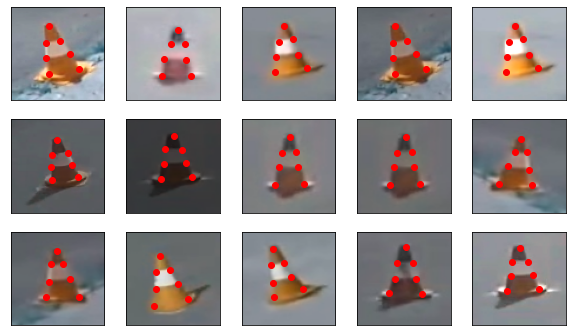

In [ ]:
pred_keypts = []

for img in y_heatmaps_train:
  keypts_img = []  
  for heatmap in img:
    pred_xy = np.argmax(heatmap)
    x = pred_xy % 80
    y = pred_xy / 80
    keypts_img.append(x)
    keypts_img.append(y)
  pred_keypts.append(keypts_img)

keypt_predictions = np.array(pred_keypts)

fig = plt.figure(figsize=(10, 10))


for id in range(15):
    ax = fig.add_subplot(5, 5, id + 1, xticks=[], yticks=[])
    x_values = keypt_predictions[id][::2]
    y_values = keypt_predictions[id][1::2]
    plt.imshow(X_train[id])
    plt.scatter(x_values, y_values, color='red');

plt.show()


## Training

In [ ]:
metrics = tf.keras.metrics.MeanSquaredError()
checkpoint = ModelCheckpoint('best_thus_far_heatmap', verbose=1, monitor='val_loss',save_best_only=True, mode='auto')

In [ ]:
model.compile(loss=tf.keras.losses.MeanSquaredError(), optimizer=Adam(0.001), metrics = [metrics])

In [ ]:
%load_ext tensorboard
import datetime

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [ ]:
logdir = os.path.join("logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
tensorboard_callback = tf.keras.callbacks.TensorBoard(logdir, histogram_freq=1)
model.compile(loss=tf.keras.losses.MeanSquaredError(), optimizer=Adam(0.001), metrics = [metrics])

In [ ]:
weights_train = model.fit(X_train, y_heatmaps_train_T, validation_split=0.2, batch_size = 4, shuffle=True, epochs=125, verbose=1, callbacks = [checkpoint, tensorboard_callback])

Epoch 1/125
13/13 [==============================] - ETA: 0s - loss: 0.4233 - mean_squared_error: 0.4233
Epoch 1: val_loss improved from inf to 1.98226, saving model to best_thus_far_heatmap
INFO:tensorflow:Assets written to: best_thus_far_heatmap/assets
13/13 [==============================] - 25s 2s/step - loss: 0.4233 - mean_squared_error: 0.4233 - val_loss: 1.9823 - val_mean_squared_error: 1.9823
Epoch 2/125
13/13 [==============================] - ETA: 0s - loss: 0.0612 - mean_squared_error: 0.0612
Epoch 2: val_loss improved from 1.98226 to 1.51186, saving model to best_thus_far_heatmap
INFO:tensorflow:Assets written to: best_thus_far_heatmap/assets
13/13 [==============================] - 21s 2s/step - loss: 0.0612 - mean_squared_error: 0.0612 - val_loss: 1.5119 - val_mean_squared_error: 1.5119
Epoch 3/125
13/13 [==============================] - ETA: 0s - loss: 0.0261 - mean_squared_error: 0.0261
Epoch 3: val_loss improved from 1.51186 to 1.40030, saving model to best_thus_far_h

In [ ]:
model.load_weights('best_thus_far_heatmap')

In [ ]:
%tensorboard --logdir logs

##Keypoint Predictions

In [ ]:
# Test predictions model accuracy

def predict(X, ground_truths):
  heatmap_predictions = model.predict(X)
  heatmap_predictions = np.swapaxes(heatmap_predictions,1,2)
  heatmap_predictions = np.swapaxes(heatmap_predictions,1,3)

  pred_keypts = []

  for img in heatmap_predictions:
    keypts_img = []  
    for heatmap in img:
      pred_xy = np.argmax(heatmap)
      x = pred_xy % 80
      y = pred_xy // 80
      keypts_img.append(x)
      keypts_img.append(y)
    pred_keypts.append(keypts_img)

  keypt_predictions = np.array(pred_keypts)
  
  ct = 0
  while ct < len(X):
    fig = plt.figure(figsize=(5, 5))
    
    # predicted
    ax = fig.add_subplot(1, 2, 1, xticks=[], yticks=[])
    x_values = keypt_predictions[ct][::2]
    y_values = keypt_predictions[ct][1::2]
    plt.imshow(X[ct])
    plt.scatter(x_values, y_values, color='red');


    #actual
    ax = fig.add_subplot(1, 2, 2, xticks=[], yticks=[])
    x_values = ground_truths[ct][::2]
    y_values = ground_truths[ct][1::2]
    plt.imshow(X[ct])
    plt.scatter(x_values, y_values, color='red');
    ct += 1


    plt.show();


In [ ]:
predict(X_test, y_test)

In [ ]:
predict(X_train, y_train)

## Time Test

In [ ]:
import time

delta_avg = 0

for i in range(1, 101):
  start = time.perf_counter()
  heatmap_predictions = model.predict(X_test)
  stop = time.perf_counter()
  delta_avg = (delta_avg * (i - 1) + (stop-start)) / i

print(delta_avg / len(X_test))



# Naive Model with MSE



In [ ]:
# Neural Network

In [ ]:
# ResNet Layer taken from MIT

# Info: ResNet Block is essentially a group of convolutions, batch normalization,
# and activation functions in chain. This adds density to the model in order to make
# more accurate predictions and fit the training data better. A good analogy to math 
# would be similar to using a higher dimensional model to fit a dataset but this is not
# an exact comparison.

def ResNetBlock(input_data,C):

  x = Conv2D(filters=C,kernel_size=(3,3),padding='same',dilation_rate=(2,2))(input_data)
  x = BatchNormalization()(x)
  x = Activation('relu')(x)
  #LeakyReLU(alpha = 0.1)

  x = Conv2D(filters= C,kernel_size=(3,3),padding='same')(x)
  x = BatchNormalization()(x)
  #x = Activation('relu')(x)
  #x = Dropout(0.2)(x)

  x_shortcut = Conv2D(filters=C,kernel_size=(1,1),padding='same')(input_data)
  x_shortcut = BatchNormalization()(x_shortcut)

  x = Add()([x,x_shortcut])
#x = Dropout(0.3)(x)
  x = Activation('relu')(x)

  #LeakyReLU(alpha = 0.1)
  #Dropout()?

  return x

In [ ]:
input = tf.keras.Input((80, 80, 3))

In [ ]:
num_filters = 64
num_classes = 14

In [ ]:
# Input layer to first CNN layer

nn = tf.keras.layers.Conv2D(filters=num_filters, kernel_size=7,strides=(1,1),padding='same',kernel_initializer='he_normal')(input)

In [ ]:
# Batch normalization

nn = tf.keras.layers.BatchNormalization()(nn)

#Activation function : ReLU (Rectified Linear Unit)

nn = tf.keras.layers.Activation('relu')(nn)


In [ ]:
# Adding ResNet layers
nn = ResNetBlock(nn, 16)
nn = ResNetBlock(nn, 32)
nn = ResNetBlock(nn, 64)

In [ ]:
# Flatten the final activation layer and create output layer

In [ ]:
nn = Flatten()(nn)
output = Dense(14)(nn)

In [ ]:
# Defining the model

In [ ]:
model = Model(input, output)

In [ ]:
model.summary()

In [ ]:
# Model plot

In [ ]:
tf.keras.utils.plot_model(model,show_shapes=True)

In [ ]:
# Compile model with basic loss

In [ ]:
metrics = tf.keras.metrics.MeanSquaredError()

In [ ]:
model.compile(loss=tf.keras.losses.MeanSquaredError(), optimizer=Adam(0.001), metrics = [metrics])

In [ ]:
%load_ext tensorboard
import datetime

In [ ]:
logdir = os.path.join("logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
tensorboard_callback = tf.keras.callbacks.TensorBoard(logdir, histogram_freq=1)
model.compile(loss=cr_loss, optimizer=Adam(0.001), metrics = [metrics])

In [ ]:
weights_train = model.fit(X_train, y_train, validation_split=0.2, batch_size = 4, shuffle=True, epochs=50, verbose=1)

In [ ]:
%tensorboard --logdir logs

In [ ]:
# Test predictions model accuracy

In [ ]:
keypt_predictions = model.predict(X_test)

In [ ]:
keypt_predictions[0]

In [ ]:
# Display the results

In [ ]:
def plot_keypoints(img,points):
  img = img#.reshape(targetSize[0],targetSize[1])
  plt.imshow(img,cmap='gray')
  for i in range(0,14,2):
    plt.scatter((points[i] + 0.5)*targetSize[0], (points[i+1]+0.5)*targetSize[0], color='red')

In [ ]:
fig = plt.figure(figsize=(10, 10))

for id in range(15):
    ax = fig.add_subplot(5, 5, id + 1, xticks=[], yticks=[])
    x_values = keypt_predictions[id][::2]
    y_values = keypt_predictions[id][1::2]
    plt.imshow(X_test[id])
    plt.scatter(x_values, y_values, color='red');

plt.show()

In [ ]:
#Darren's Callbacks Implementation
#Minimize Loss and Prevent Overfitting in the Model - Pre-Emptive Stopping at Validation and Training Divergence
callback = tf.keras.callbacks.EarlyStopping(
    monitor='loss', 
    min_delta=0, 
    patience=5, 
    verbose=1,
    mode='min', 
    baseline=None, 
    restore_best_weights=False
)
# This callback will stop the training when there is no improvement in
# the loss for 5 consecutive epochs.
model = tf.keras.models.Sequential([tf.keras.layers.Dense(10)])
model.compile(tf.keras.optimizers.SGD(), loss='mse')
history = model.fit(np.arange(100).reshape(5, 20), np.zeros(5),
                    epochs=50, batch_size=1, callbacks=[callback],
                    verbose=1)

print('Finished running minimization of loss in model. Epochs: ' + str(len(history.history['loss'])))

# Cross Ratio Model Testing - New

## Model architecture

In [ ]:
from sklearn.model_selection import train_test_split 
from tensorflow.keras import backend as k

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(images_final, keypts_final, test_size=0.2, random_state=42)

In [ ]:
X_train.shape


In [ ]:
y_train.shape

In [ ]:
# Neural Network

In [ ]:
# ResNet Layer taken from MIT

# Info: ResNet Block is essentially a group of convolutions, batch normalization,
# and activation functions in chain. This adds density to the model in order to make
# more accurate predictions and fit the training data better. A good analogy to math 
# would be similar to using a higher dimensional model to fit a dataset but this is not
# an exact comparison.

def ResNetBlock(input_data,C):

  x = Conv2D(filters=C,kernel_size=(3,3),padding='same',dilation_rate=(2,2))(input_data)
  x = BatchNormalization()(x)
  x = Activation('relu')(x)
  #LeakyReLU(alpha = 0.1)

  x = Conv2D(filters= C,kernel_size=(3,3),padding='same')(x)
  x = BatchNormalization()(x)
  #x = Activation('relu')(x)
  #x = Dropout(0.2)(x)

  x_shortcut = Conv2D(filters=C,kernel_size=(1,1),padding='same')(input_data)
  x_shortcut = BatchNormalization()(x_shortcut)

  x = Add()([x,x_shortcut])
#x = Dropout(0.3)(x)
  x = Activation('relu')(x)

  #LeakyReLU(alpha = 0.1)
  #Dropout()?

  return x

In [ ]:
input = tf.keras.Input((80, 80, 3))

In [ ]:
num_filters = 64
num_classes = 14

In [ ]:
# Input layer to first CNN layer

nn = tf.keras.layers.Conv2D(filters=num_filters, kernel_size=7,strides=(1,1),padding='same',kernel_initializer='he_normal')(input)

In [ ]:
# Batch normalization

nn = tf.keras.layers.BatchNormalization()(nn)

#Activation function : ReLU (Rectified Linear Unit)

nn = tf.keras.layers.Activation('relu')(nn)


In [ ]:
# Adding ResNet layers
nn = ResNetBlock(nn, 16) # orig 64
nn = ResNetBlock(nn, 32) # orig 32
nn = ResNetBlock(nn, 64) # orig 32

In [ ]:
# Flatten the final activation layer and create output layer

In [ ]:
nn = Flatten()(nn)

#ADDING MORE DENSE LAYERS
#nn = Dense(64)(nn)
#nn = Dense(32)(nn)

output = Dense(14)(nn)

In [ ]:
# Defining the model

In [ ]:
model = Model(input, output)

In [ ]:
model.summary()

In [ ]:
# Model plot

In [ ]:
tf.keras.utils.plot_model(model,show_shapes=True)

## Loss function

In [ ]:
# Compile model with Cr loss
cr3D = 1.39408 # fixed cross ratio for a cone
gamma = 0.0001

pts_1 = [0, 1, 2, 3]
pts_2 = [0, 4, 5, 6]

def delta_ij(y, i, j):
    return k.sqrt(k.sum(k.square(y[2*i:2*i+2,] - y[2*j:2*j+2,])))

def cross_ratio(y, pts):
    assert len(pts) == 4, 'must be 4 collinear points'
    return (delta_ij(y, pts[0], pts[2]) / delta_ij(y, pts[0], pts[3])) / (delta_ij(y, pts[1], pts[2]) / delta_ij(y, pts[1], pts[3]))

def cr_loss(y_true, y_pred):
    cr_1_fn = lambda y : cross_ratio(y, pts_1) - cr3D
    cr_2_fn = lambda y: cross_ratio(y, pts_2) - cr3D

    cr_1 = tf.map_fn(cr_1_fn, y_pred)
    cr_2 = tf.map_fn(cr_2_fn, y_pred)

    return tf.reduce_mean(tf.math.square(y_true - y_pred), axis=-1) + gamma * tf.reduce_mean(tf.math.square(cr_1)) 
    + gamma * tf.reduce_mean(tf.math.square(cr_2))

## Training 

In [ ]:
metrics = tf.keras.metrics.MeanSquaredError()

In [ ]:
checkpoint = ModelCheckpoint('best_thus_far', verbose=1, monitor='val_loss',save_best_only=True, mode='auto')

In [ ]:
#model.compile(loss=cr_loss, optimizer=Adam(0.001), metrics = [metrics])
model.compile(loss=cr_loss, optimizer=Adam(0.001), metrics = [metrics])

In [ ]:
weights_train = model.fit(X_train, y_train, validation_split=0.2, batch_size = 4, shuffle=True, epochs=50, verbose=1, callbacks = [checkpoint])

In [ ]:
# Load best model
model.load_weights('best_thus_far')

##Keypoint Predictions

In [ ]:
# Test predictions model accuracy

def predict(X, ground_truths):
  keypt_predictions = model.predict(X)
  
  ct = 0
  while ct < len(X):
    fig = plt.figure(figsize=(5, 5))
    
    # predicted
    ax = fig.add_subplot(1, 2, 1, xticks=[], yticks=[])
    x_values = keypt_predictions[ct][::2]
    y_values = keypt_predictions[ct][1::2]
    plt.imshow(X[ct])
    plt.scatter(x_values, y_values, color='red');

    #actual
    ax = fig.add_subplot(1, 2, 2, xticks=[], yticks=[])
    x_values = ground_truths[ct][::2]
    y_values = ground_truths[ct][1::2]
    plt.imshow(X[ct])
    plt.scatter(x_values, y_values, color='red');
    ct += 1


    plt.show();


In [ ]:
predict(X_test, y_test)

In [ ]:
predict(X_train, y_train)

## Time Test

In [ ]:
import time

delta_avg = 0

for i in range(1, 101):
  start = time.perf_counter()
  heatmap_predictions = model.predict(X_test)
  stop = time.perf_counter()
  delta_avg = (delta_avg * (i - 1) + (stop-start)) / i

print(delta_avg / len(X_test))

# NN Improvements

In [ ]:
# Potential improvements in NN by reducing complexity

In [ ]:
from sklearn.model_selection import train_test_split 
from tensorflow.keras import backend as k

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(images_final, keypts_final, test_size=0.2, random_state=42)

#Sources



Dhall, Ankit, et al. (2019) MIT Keypoint Regression [Source code]. Massachusetts Institute of Technology.

Dhall, Ankit, et al. “Real-Time 3D Traffic Cone Detection for Autonomous Driving.” 2019 IEEE Intelligent Vehicles Symposium (IV), 2019, doi:10.1109/ivs.2019.8814089.

Teixeira, Brian et al. “Adaloss: Adaptive Loss Function for Landmark Localization.” ArXiv abs/1908.01070 (2019): n. pag.